## Imports

We import the necessary modules and functions from these modules to be used further.

In [1]:
!pip install tensorflow --user

In [3]:
import pandas as pd
import numpy as np
import matplotlib
from tqdm import tqdm
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from sklearn.neural_network import MLPClassifier
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split
import librosa

## Importing the data and data preprocessing

We now import the cv-valid-dev.csv which consists of the names of the file in the cv-valid-dev folder of the Common Voice dataset. We only include the 'filename' and 'gender' columns, as only those are relevant to us. We drop any rows with null values in the 'gender' column, and also rows with 'other' in the gender column. Since our dataset is already saved in Jupyter, we just have to add './' before the filename to import it into this notebook.

In [4]:
df = pd.read_csv("./cv-valid-dev.csv") 
df=df[['filename', 'gender']]
df=df.dropna()
df=df.reset_index()
df=df[['filename', 'gender']]
df=df[df['gender']!='other']
df.head()

,filename,gender
0,cv-valid-dev/sample-000004.mp3,female
1,cv-valid-dev/sample-000005.mp3,male
2,cv-valid-dev/sample-000008.mp3,female
3,cv-valid-dev/sample-000009.mp3,female
4,cv-valid-dev/sample-000013.mp3,male


In [5]:
df.tail()

,filename,gender
1535,cv-valid-dev/sample-004053.mp3,female
1536,cv-valid-dev/sample-004055.mp3,male
1537,cv-valid-dev/sample-004067.mp3,female
1538,cv-valid-dev/sample-004069.mp3,male
1539,cv-valid-dev/sample-004073.mp3,male


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1529 entries, 0 to 1539
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  1529 non-null   object
 1   gender    1529 non-null   object
dtypes: object(2)
memory usage: 35.8+ KB


In [7]:
# get total samples
n_samples = len(df)
# get total male samples
n_male_samples = len(df[df['gender'] == 'male'])
# get total female samples
n_female_samples = len(df[df['gender'] == 'female'])
print("Total samples:", n_samples)
print("Total male samples:", n_male_samples)
print("Total female samples:", n_female_samples)

Total samples: 1529
Total male samples: 1135
Total female samples: 394


As we can see, this is a skewed dataset. So we include the 'female' entries from cv.valid.test.

In [8]:
df1 = pd.read_csv("./cv-valid-test.csv") 
df1=df1[['filename', 'gender']]
df1=df1.dropna()
df1=df1.reset_index()
df1=df1[['filename', 'gender']]
df1=df1[df1['gender']=='female']
df1.head()

,filename,gender
15,cv-valid-test/sample-000033.mp3,female
16,cv-valid-test/sample-000034.mp3,female
18,cv-valid-test/sample-000036.mp3,female
24,cv-valid-test/sample-000051.mp3,female
30,cv-valid-test/sample-000061.mp3,female


In [9]:
# get total samples
n_samples = len(df1)
# get total male samples
#n_male_samples = len(df[df['gender'] == 'male'])
# get total female samples
print("Total samples:", n_samples)

Total samples: 392


In [10]:
df2=df.append(df1)

In [11]:
# get total samples
n_samples = len(df2)
# get total male samples
n_male_samples = len(df2[df2['gender'] == 'male'])
# get total female samples
n_female_samples=len(df2[df2['gender']=='female'])
print("Total samples:", n_samples)
print("Total male samples:", n_male_samples)
print("Total female samples:", n_female_samples)

Total samples: 1921
Total male samples: 1135
Total female samples: 786


The dataset is still skewed, so we drop about 40% of the 'male' entries. This is called undersampling. This will help the neural network to not overfit on a particular gender.

In [12]:
df2 = df2.drop(df2[df2['gender'] == 'male'].sample(frac=0.4).index)

We add './' to each entry in the 'filename' column so that we can easily import the audio files from Jupyter itself later on.

In [13]:
df2['filename']='./'+df2['filename']

In [14]:
df2.head()

,filename,gender
0,./cv-valid-dev/sample-000004.mp3,female
2,./cv-valid-dev/sample-000008.mp3,female
3,./cv-valid-dev/sample-000009.mp3,female
4,./cv-valid-dev/sample-000013.mp3,male
6,./cv-valid-dev/sample-000021.mp3,female


In [15]:
df2=df2.reset_index()

In [16]:
df2=df2[['filename', 'gender']]
df2.head()

,filename,gender
0,./cv-valid-dev/sample-000004.mp3,female
1,./cv-valid-dev/sample-000008.mp3,female
2,./cv-valid-dev/sample-000009.mp3,female
3,./cv-valid-dev/sample-000013.mp3,male
4,./cv-valid-dev/sample-000021.mp3,female


In [17]:
# get total samples
n_samples = len(df2)
# get total male samples
n_male_samples = len(df2[df2['gender'] == 'male'])
# get total female samples
n_female_samples=len(df2[df2['gender']=='female'])
print("Total samples:", n_samples)
print("Total male samples:", n_male_samples)
print("Total female samples:", n_female_samples)

Total samples: 1369
Total male samples: 681
Total female samples: 688


## Audio sample

We take a sample audio and explore it and the features we will be using before building our model and training it with the datasets. First, we use IPython to play the audio file in the notebook itself.

In [18]:
audio_file = './cv-valid-dev/sample-000013.mp3'
import IPython.display as ipd
ipd.Audio(audio_file)

We have to install ffmpeg and import to process the audio files.

In [19]:
!pip install ffmpeg-python 

We use librosa to load the audio file, extract the numpy array (nparray) consisting of the audio data and the sampling rate (sr). nparray is typically an audio signal represented as a one-dimensional numpy.ndarray of floating-point values, where y(t) corresponds to the amplitude of the waveform at sample t. Total number of samples = duration of this audio file x sr.

In [20]:
nparray, sr = librosa.load(audio_file, sr=None)

C:\Anaconda\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [21]:
print(nparray.shape)
print(sr)

(236160,)
48000


We plot the waveform of amplitude vs time.

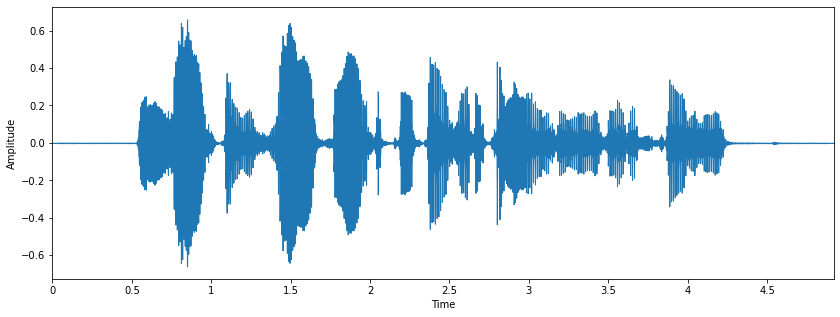

In [23]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
plt.ylabel('Amplitude')
librosa.display.waveplot(nparray, sr=sr)

## Audio features

We can take a look at some of the features we shall be using to train our model with. 

### Spectrogram

We now display the spectrogram. A spectrogram is a visual way of representing the signal strength, or “loudness”, of a signal over time at various frequencies present in a particular waveform. STFT converts signal such that we can know the amplitude of given frequency at a given time. Using STFT we can determine the amplitude of various frequencies playing at a given time of an audio signal. A spectrogram is usually depicted as a heat map, i.e., as an image with the intensity shown by varying the color or brightness.

(1025, 462)


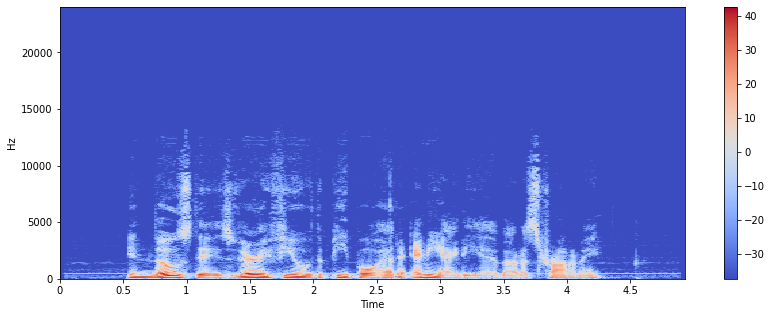

In [24]:
X = librosa.stft(nparray)
Xdb = librosa.amplitude_to_db(abs(X))
print(Xdb.shape)
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz') 
plt.colorbar()

Since we see that all action is taking place at the bottom of the spectrum, we can convert the frequency axis to a logarithmic one.

C:\Anaconda\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Anaconda\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Anaconda\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


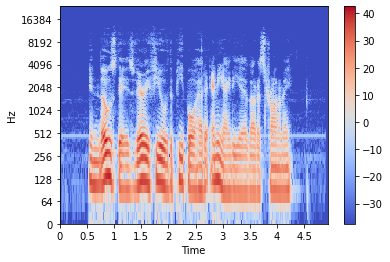

In [25]:
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

### Mel-Frequency Spectrogram

A mel spectrogram is a spectrogram where the frequencies are converted to the mel scale. The mel scale is a perceptual scale of pitches judged by listeners to be equal in distance from one another. 

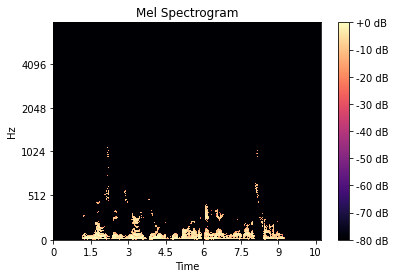

In [28]:
mel_spect = librosa.feature.melspectrogram(y=nparray, sr=sr, n_fft=2048, hop_length=1024)
mel_spect = librosa.power_to_db(Xdb, ref=np.max)
librosa.display.specshow(mel_spect, y_axis='mel', fmax=8000, x_axis='time');
plt.title('Mel Spectrogram');
plt.colorbar(format='%+2.0f dB');

### Mel-Frequency Cepstral Coefficients

We look at the Mel-Frequency Cepstral Coefficients. The envelope of the time power spectrum of the speech signal is representative of the vocal tract and MFCCs accurately represents this envelope.By printing the shape of mfccs you get how many mfccs are calculated on how many frames. The first value represents the number of mfccs calculated and another value represents a number of frames available. Generally the first 13 coefficients(the lower dimensions) of MFCC are taken as features as they represent the envelope of spectra. And the discarded higher dimensions expresses the spectral details.

(20, 462)


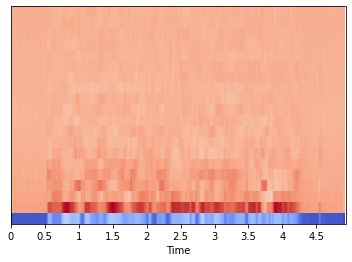

In [26]:
mfccs = librosa.feature.mfcc(nparray, sr=sr)
print(mfccs.shape)
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

### Chroma

Now we take a look at the Chroma feature. In music, the term chroma feature or chromagram closely relates to the twelve different pitch classes. Chroma-based features are also referred to as “pitch class profiles”. Two of the main chroma features are 
(a) Chroma vector: A 12-element representation of the spectral energy where the bins represent the 12 equal-tempered pitch classes of western-type music (semitone spacing). 
(b) Chroma deviation: The standard deviation of the 12 chroma coefficients.

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


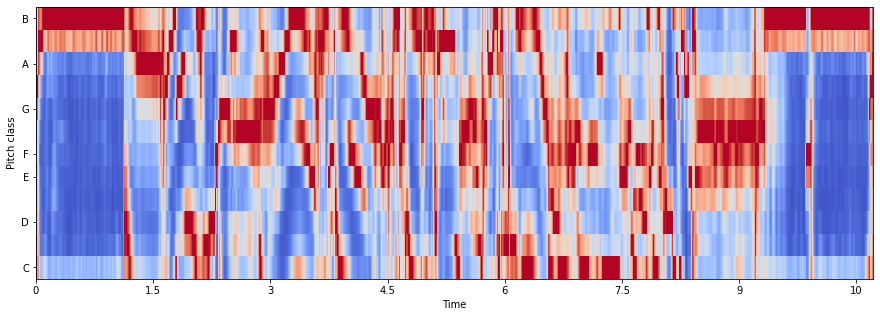

In [27]:
hop_length=12
chromagram = librosa.feature.chroma_stft(nparray, sr=sr, hop_length=hop_length)
print(chromagram)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')

## Feature extraction

We define a function that extracts MFCCs, chroma, and mel-spectrum frequency features and stores them in a multi-dimensional array to be fed into the model.

In [29]:
def extract_feature(file_name, mfcc, chroma, mel):
    nparray, sr = librosa.load(file_name, sr=None)
    X = nparray
    sample_rate=sr
    if chroma:
        stft=np.abs(librosa.stft(X))
        result=np.array([])
    if mfcc:
        mfccs=np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T, axis=0)
        result=np.hstack((result, mfccs))
    if chroma:
        chroma=np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
        result=np.hstack((result, chroma))
    if mel:
        mel=np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
        result=np.hstack((result, mel))
    return result

We now assign numerical labels to our classes.

In [30]:
label2int = {
    "male": 1,
    "female": 0
}

Here we define a function that creates the data variable x and target variable y. We use tqdm to track the progress of this extraction process.

In [31]:
def load_data(test_size=0.2):
    x,y=[],[]
    for i, (file, gender) in tqdm(enumerate(zip(df2['filename'], df2['gender'])), total=n_samples):
        feature=extract_feature(file, mfcc=True, chroma=True, mel=True)
        x.append(feature)
        y.append(label2int[gender])
       
    return train_test_split(np.array(x), y, test_size=test_size, random_state=9)

## Splitting the dataset 

We split the data into train and test sets in 80:20 ratio, and check their shapes.

In [32]:
x_train,x_test,y_train,y_test=load_data(test_size=0.2)

100%|██████████| 1369/1369 [14:43<00:00,  1.55it/s]


In [33]:
print((x_train.shape, x_test.shape))

((1095, 180), (274, 180))


In [34]:
print(f'Features extracted: {x_train.shape[1]}')

Features extracted: 180


## Building the model

We are going to use a deep feed-forward neural network with 5 hidden layers. We're using a 30% dropout rate after each fully connected layer. This type of regularization will hopefully prevent overfitting on the training dataset. We're using a single output unit (neuron) with a sigmoid activation function in the output layer, so the model will output the scalar 1 (or close to it) when the audio's speaker is a male, and female when it's closer to 0. We're using binary cross entropy as the loss function, as it is a special case of categorical cross entropy when we only have 2 classes to predict.

In [35]:
def create_model(vector_length=180):
    """5 hidden dense layers from 256 units to 64, not the best model."""
    model = Sequential()
    model.add(Dense(256, input_shape=(vector_length,)))
    model.add(Dropout(0.3))
    model.add(Dense(256, activation="relu"))
    model.add(Dropout(0.3))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.3))
    model.add(Dense(128, activation="relu"))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation="relu"))
    model.add(Dropout(0.3))
    # one output neuron with sigmoid activation function, 0 means female, 1 means male
    model.add(Dense(1, activation="sigmoid"))
    # using binary crossentropy as it's male/female classification (binary)
    model.compile(loss="binary_crossentropy", metrics=["accuracy"], optimizer="adam")
    # print summary of the model
    model.summary()
    return model

In [36]:
model = create_model()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               46336     
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)               1

## Training the model

We fit the model now.

In [37]:
batch_size = 64
epochs = 100
model.fit(np.array(x_train), np.array(y_train), epochs=epochs, batch_size=batch_size)

Epoch 1/100
18/18 [==============================] - 5s 17ms/step - loss: 9.2622 - accuracy: 0.5016
Epoch 2/100
18/18 [==============================] - 0s 15ms/step - loss: 2.9488 - accuracy: 0.5364
Epoch 3/100
18/18 [==============================] - 0s 14ms/step - loss: 1.9307 - accuracy: 0.4943
Epoch 4/100
18/18 [==============================] - 0s 10ms/step - loss: 1.4919 - accuracy: 0.5275
Epoch 5/100
18/18 [==============================] - 0s 9ms/step - loss: 1.2864 - accuracy: 0.4914
Epoch 6/100
18/18 [==============================] - 0s 16ms/step - loss: 1.0841 - accuracy: 0.5003
Epoch 7/100
18/18 [==============================] - 0s 15ms/step - loss: 0.9816 - accuracy: 0.5039
Epoch 8/100
18/18 [==============================] - 0s 9ms/step - loss: 0.9055 - accuracy: 0.5058
Epoch 9/100
18/18 [==============================] - 0s 8ms/step - loss: 0.8249 - accuracy: 0.4980
Epoch 10/100
18/18 [==============================] - 0s 8ms/step - loss: 0.8708 - accuracy: 0.5042
Epo

## Testing the model 

We will use the test data to test out model, and then use the predictions and the test labels to calculate accuracy and loss. Loss is the penalty for a bad prediction. That is, loss is a number indicating how bad the model's prediction was on a single example.

In [38]:
y_pred=model.predict(x_test)

In [39]:
loss, accuracy = model.evaluate(np.array(x_test), np.array(y_test), verbose=0)
print(f"Loss: {loss:.4f}")
print(f"Accuracy: {accuracy*100:.2f}%")

Loss: 0.3449
Accuracy: 87.59%


We have reached an accuracy of 87.59%.

## Testing the model using your own voice

Now we will input our voice to test the model. 

We install torchaudio, provides powerful audio I/O functions, preprocessing transforms and dataset.

In [40]:
!pip install torchaudio 

We can create a media stream out of the audio using ipywebrtc. 

In [41]:
!pip install ipywebrtc 

Using AudioRecorder from this API, we can record our voice. CameraStream represents a media source, such as a microphone.

In [42]:
from ipywebrtc import AudioRecorder, CameraStream
import torchaudio
from IPython.display import Audio

C:\Anaconda\lib\site-packages\torchaudio\extension\extension.py:13: UserWarning: torchaudio C++ extension is not available.
  warnings.warn('torchaudio C++ extension is not available.')


In [56]:
camera = CameraStream(constraints={'audio': True,'video':False})
recorder = AudioRecorder(stream=camera)
recorder

AudioRecorder(audio=Audio(value=b'', format='webm'), stream=CameraStream(constraints={'audio': True, 'video': …

We then need to save and convert the data into a format that torchaudio can read. We convert with ffmpeg from webm to ffmpeg, load the signal with torchaudio and prove that it is the same by putting the data into a Audio Widget and playing it back.

In [57]:
with open('recording.webm', 'wb') as f:
    f.write(recorder.audio.value)
!ffmpeg -i recording.webm -ac 1 -f wav file.wav -y -hide_banner -loglevel panic
sig, sr = torchaudio.load("file.wav")
print(sig.shape)
Audio(data=sig, rate=sr)

torch.Size([1, 167040])


Now we use the extract_feature function to extract the requires speech features from our own voice.

In [58]:
my_features=extract_feature('file.wav', mfcc=True, chroma=True, mel=True).reshape(1,-1)
print(my_features.shape)

(1, 180)


Now we input these features to predict the gender.

In [59]:
male_prob = model.predict(my_features)
female_prob = 1 - male_prob
gender = "male" if male_prob > female_prob else "female"
print("Result:", gender)

Result: female


## Miscellaneous

This code snippet was used to extract the large Common Voice dataset from the zip file directly into Jupyter.

In [22]:
import zipfile
#with zipfile.ZipFile(r'C:\Users\Pratiksha Pradhan\Downloads\common_voice.zip','r') as zip_ref:
    #zip_ref.extractall(path=None, members=None, pwd=None)
    
zf = zipfile.ZipFile(r'C:\Users\Pratiksha Pradhan\Downloads\common_voice.zip', 'r')
uncompress_size = sum((file.file_size for file in zf.infolist()))
extracted_size = 0
for file in zf.infolist():
    extracted_size += file.file_size
    print("%s %%\r" % (extracted_size * 100/uncompress_size))
    zf.extract(file)

1.1428416740263619e-06 %
2.966964449214245e-05 %
0.01743977131881437 %
0.01752023474583792 %
0.017783788782212578 %
0.017997795102139127 %
0.018300987311672276 %
0.018604179521205425 %
0.018993726322262424 %
0.01914827538245124 %
0.01950384660651525 %
0.0197957136237174 %
0.020045111169678314 %
0.020436073619776687 %
0.020607610468462 %
0.020857008014422914 %
0.021046948300646094 %
0.021209991255083157 %
0.02152026170982318 %
0.02178098444811509 %
0.022147880864510097 %
0.022443994828836373 %
0.0228986614857966 %
0.023282545690688102 %
0.023463992082663036 %
0.02385495453276141 %
0.024203447511618546 %
0.024391972148800352 %
0.024785765896981473 %
0.024914833274425546 %
0.025189712503131203 %
0.02557784365514683 %
0.025757874398080388 %
0.025872785285110715 %
0.02603016564338228 %
0.026449441074308147 %
0.026691760375062188 %
0.027150673979146542 %
0.0274198906116867 %
0.027579630385027223 %
0.027677081600547264 %
0.02781322722319821 %
0.028094712814096947 %
0.030381229330595897 %
0.03